In [1]:
#installing dependencies
!pip install -U textblob
!python -m textblob.download_corpora
!pip install -U sentence-transformers
!pip install wordcloud

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
[nltk_data] Downloading package brown to /root/nltk_data...
[nltk_data]   Package brown is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package conll2000 to /root/nltk_data...
[nltk_data]   Package conll2000 is already up-to-date!
[nltk_data] Downloading package movie_reviews to /root/nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!
Finished.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: h

In [2]:
#importing necessary libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

import re
import nltk
from nltk import word_tokenize,sent_tokenize
from nltk.stem import WordNetLemmatizer
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.corpus import stopwords
nltk.download("stopwords")

from sentence_transformers import SentenceTransformer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from wordcloud import WordCloud , STOPWORDS
from sklearn.feature_extraction.text import CountVectorizer , TfidfVectorizer

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
#loading the data
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
data_path = os.path.join("/content/drive/MyDrive/Data/TEDTalks/ted_main.csv")
transcripts = os.path.join("/content/drive/MyDrive/Data/TEDTalks/transcripts.csv")

In [5]:
#importing the data as a pandas dataframe
data = pd.read_csv(data_path)
transcripts = pd.read_csv(transcripts)

In [6]:
data.head()

,comments,description,duration,event,film_date,languages,main_speaker,name,num_speaker,published_date,ratings,related_talks,speaker_occupation,tags,title,url,views
0,4553,Sir Ken Robinson makes an entertaining and pro...,1164,TED2006,1140825600,60,Ken Robinson,Ken Robinson: Do schools kill creativity?,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 19645}, {...","[{'id': 865, 'hero': 'https://pe.tedcdn.com/im...",Author/educator,"['children', 'creativity', 'culture', 'dance',...",Do schools kill creativity?,https://www.ted.com/talks/ken_robinson_says_sc...,47227110
1,265,With the same humor and humanity he exuded in ...,977,TED2006,1140825600,43,Al Gore,Al Gore: Averting the climate crisis,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 544}, {'i...","[{'id': 243, 'hero': 'https://pe.tedcdn.com/im...",Climate advocate,"['alternative energy', 'cars', 'climate change...",Averting the climate crisis,https://www.ted.com/talks/al_gore_on_averting_...,3200520
2,124,New York Times columnist David Pogue takes aim...,1286,TED2006,1140739200,26,David Pogue,David Pogue: Simplicity sells,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 964}, {'i...","[{'id': 1725, 'hero': 'https://pe.tedcdn.com/i...",Technology columnist,"['computers', 'entertainment', 'interface desi...",Simplicity sells,https://www.ted.com/talks/david_pogue_says_sim...,1636292
3,200,"In an emotionally charged talk, MacArthur-winn...",1116,TED2006,1140912000,35,Majora Carter,Majora Carter: Greening the ghetto,1,1151367060,"[{'id': 3, 'name': 'Courageous', 'count': 760}...","[{'id': 1041, 'hero': 'https://pe.tedcdn.com/i...",Activist for environmental justice,"['MacArthur grant', 'activism', 'business', 'c...",Greening the ghetto,https://www.ted.com/talks/majora_carter_s_tale...,1697550
4,593,You've never seen data presented like this. Wi...,1190,TED2006,1140566400,48,Hans Rosling,Hans Rosling: The best stats you've ever seen,1,1151440680,"[{'id': 9, 'name': 'Ingenious', 'count': 3202}...","[{'id': 2056, 'hero': 'https://pe.tedcdn.com/i...",Global health expert; data visionary,"['Africa', 'Asia', 'Google', 'demo', 'economic...",The best stats you've ever seen,https://www.ted.com/talks/hans_rosling_shows_t...,12005869


**Exploratory data analysis**

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2550 entries, 0 to 2549
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   comments            2550 non-null   int64 
 1   description         2550 non-null   object
 2   duration            2550 non-null   int64 
 3   event               2550 non-null   object
 4   film_date           2550 non-null   int64 
 5   languages           2550 non-null   int64 
 6   main_speaker        2550 non-null   object
 7   name                2550 non-null   object
 8   num_speaker         2550 non-null   int64 
 9   published_date      2550 non-null   int64 
 10  ratings             2550 non-null   object
 11  related_talks       2550 non-null   object
 12  speaker_occupation  2544 non-null   object
 13  tags                2550 non-null   object
 14  title               2550 non-null   object
 15  url                 2550 non-null   object
 16  views               2550

In [8]:
transcripts.head()

,transcript,url
0,Good morning. How are you?(Laughter)It's been ...,https://www.ted.com/talks/ken_robinson_says_sc...
1,"Thank you so much, Chris. And it's truly a gre...",https://www.ted.com/talks/al_gore_on_averting_...
2,"(Music: ""The Sound of Silence,"" Simon & Garfun...",https://www.ted.com/talks/david_pogue_says_sim...
3,If you're here today — and I'm very happy that...,https://www.ted.com/talks/majora_carter_s_tale...
4,"About 10 years ago, I took on the task to teac...",https://www.ted.com/talks/hans_rosling_shows_t...


In [9]:
transcripts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2467 entries, 0 to 2466
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   transcript  2467 non-null   object
 1   url         2467 non-null   object
dtypes: object(2)
memory usage: 38.7+ KB


* Only Transcript column in the data is useful for clustering and topic modelling 
* Removing other unnecessary columns

In [10]:
#dropping unnecessary columns
transcripts.drop(['url'],axis=1,inplace=True)
df = transcripts.copy()

In [11]:
#checking for missing values in the data
df.isna().any()

transcript    False
dtype: bool

* There are no missing values in the data

In [12]:
df.head()

,transcript
0,Good morning. How are you?(Laughter)It's been ...
1,"Thank you so much, Chris. And it's truly a gre..."
2,"(Music: ""The Sound of Silence,"" Simon & Garfun..."
3,If you're here today — and I'm very happy that...
4,"About 10 years ago, I took on the task to teac..."


**Data Preprocessing**

In [13]:
#cleaning and preprocessing the data
lemmatizer = WordNetLemmatizer()
def clean_text(data):
  #lowercasing the data
  text = str(data).lower() 
  
  #tokenization
  text = word_tokenize(text)

  #removing special characters (punctuations) and also numerical characters
  text = [word for word in text if word.isalpha()]

  #removing stopwords
  text = [word for word in text if word not in set(stopwords.words("english"))]

  #lemmatizing words
  text = [lemmatizer.lemmatize(word) for word in text]
  return " ".join(text)


In [14]:
#applying data transformation function on the data
df['transcript'] = df['transcript'].apply(lambda x: clean_text(x))

In [15]:
df.head(10)

,transcript
0,good morning laughter great blown away whole t...
1,thank much chris truly great honor opportunity...
2,music sound silence simon garfunkel hello voic...
3,today happy heard sustainable development save...
4,year ago took task teach global development sw...
5,thank tell challenged excited excitement get c...
6,september morning seventh birthday came downst...
7,going present three project rapid fire much ti...
8,wonderful back love wonderful gathering must w...
9,often asked surprised book say got write would...


# **Feature Engineering**
 * Extracting features from the dataset
 * **To Extract rich embeddings i will be using SBERT since it provides embeddings with high quality and rich semantic information.**
 * using pre-trained "all-MiniLM-L6-v2" version
 * dense vectors of higher dimension (384) are obtained

In [16]:
SBert_model=SentenceTransformer("all-MiniLM-L6-v2")
SBert_features = SBert_model.encode(df['transcript'],show_progress_bar=True,convert_to_numpy=True)

Batches:   0%|          | 0/78 [00:00<?, ?it/s]

In [17]:
SBert_features.shape

(2467, 384)

In [18]:
SBert_features

array([[ 0.02445321,  0.0268878 ,  0.04065027, ...,  0.01983607,
        -0.02367823,  0.01255236],
       [-0.02959333, -0.03083882,  0.07798759, ...,  0.0281838 ,
        -0.05179625, -0.023594  ],
       [-0.02304548, -0.07025072,  0.05981876, ..., -0.04543091,
         0.02968092, -0.01019247],
       ...,
       [ 0.04735406, -0.05584   ,  0.01729292, ...,  0.03097621,
        -0.08083051, -0.03370441],
       [-0.03981843, -0.08404449, -0.01845899, ..., -0.02014662,
        -0.00924158, -0.02667023],
       [ 0.07735182, -0.08320809, -0.01899346, ...,  0.02959215,
        -0.08425391,  0.03953279]], dtype=float32)

# **Model Building**
* Using KMeans Clustering to build the clusters
* KMeans provide the support to cluster high dimensionality vectors
* To find the optimal number of clusters in the data using Elbow and silhouette method

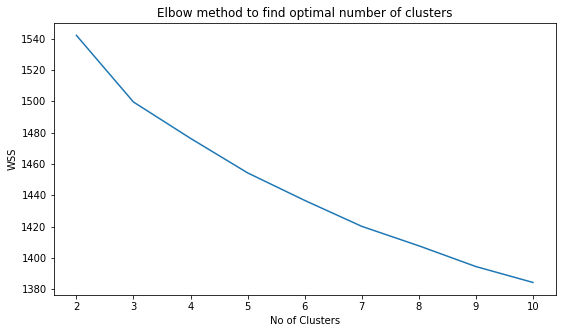

In [19]:
#Elbow method
wss=[]
for i in range(2,11):
  clustering_model = KMeans(n_clusters=i)
  clustering_model.fit(SBert_features)
  wss.append(clustering_model.inertia_)

plt.figure(figsize=(9,5))
plt.plot(range(2,11),wss)
plt.xlabel("No of Clusters")
plt.ylabel("WSS")
plt.title("Elbow method to find optimal number of clusters")
plt.show()

 For No of Clusters 2: The Silhouette coeficient is 0.03440370783209801
 For No of Clusters 3: The Silhouette coeficient is 0.03474755212664604
 For No of Clusters 4: The Silhouette coeficient is 0.028857531026005745
 For No of Clusters 5: The Silhouette coeficient is 0.029314382001757622
 For No of Clusters 6: The Silhouette coeficient is 0.028705036267638206
 For No of Clusters 7: The Silhouette coeficient is 0.03014814481139183
 For No of Clusters 8: The Silhouette coeficient is 0.027769656851887703
 For No of Clusters 9: The Silhouette coeficient is 0.02775660715997219
 For No of Clusters 10: The Silhouette coeficient is 0.02841995470225811


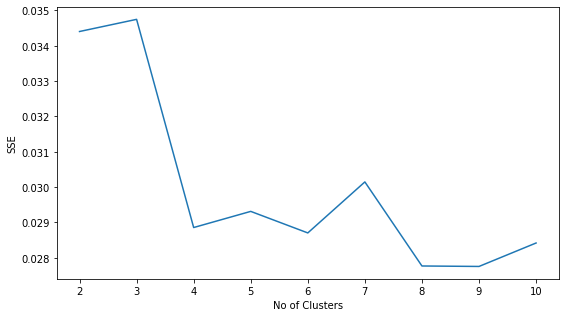

In [20]:
#silhouette method
SSE=[]
for i in range(2,11):
  clustering_model = KMeans(n_clusters=i)
  clustering_model.fit(SBert_features)
  s_score=silhouette_score(SBert_features,clustering_model.labels_)
  print(" For No of Clusters {}: The Silhouette coeficient is {}".format(i,s_score))
  SSE.append(s_score)

plt.figure(figsize=(9,5))
plt.plot(range(2,11),SSE)
plt.xlabel("No of Clusters")
plt.ylabel("SSE")
plt.show()

* From Elbow and silhouette graphs it is evident that the optimal Number of Clusters in the data are 3

In [21]:
#setting No Of Clusters to 3
n_clusters=3
clustering_model = KMeans(n_clusters=n_clusters)
clustering_model.fit(SBert_features)


cluster_assignment = clustering_model.labels_

 **Cluster visualization**
 * using principal component analysis PCA to decompose the data into 2 dimensional data to visualize the clusters

In [22]:
#standard scaling the data
scaler = StandardScaler()
scaled_embeddings = scaler.fit_transform(SBert_features)

#decomposing the data using principal component analysis
decomposer = PCA(2)
decomposed_embeddings = decomposer.fit_transform(scaled_embeddings)

In [23]:
#decomposed dataframe
pca_data=pd.DataFrame(decomposed_embeddings,columns=["PC1",'PC2'])
pca_data['assigned_cluster'] = cluster_assignment

In [24]:
pca_data

,PC1,PC2,assigned_cluster
0,-6.548009,-3.804209,0
1,-9.002427,-4.560472,0
2,-4.880935,-5.319973,0
3,2.159663,0.475002,2
4,-0.360871,4.481349,1
...,...,...,...
2462,-3.446130,5.717184,1
2463,5.045927,-1.825115,2
2464,5.589152,-5.406555,2
2465,-3.852515,-1.342855,0


In [25]:
df['cluster'] = cluster_assignment
df.head()

,transcript,cluster
0,good morning laughter great blown away whole t...,0
1,thank much chris truly great honor opportunity...,0
2,music sound silence simon garfunkel hello voic...,0
3,today happy heard sustainable development save...,2
4,year ago took task teach global development sw...,1


Text(0.5, 1.0, 'Cluster Visualization')

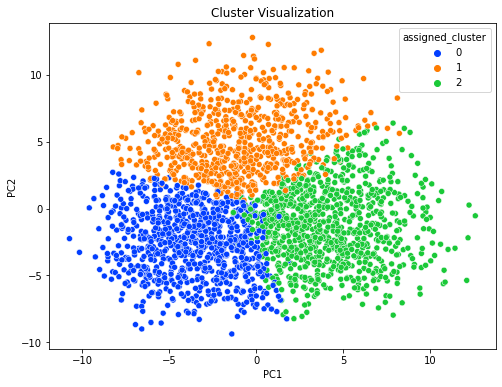

In [26]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=pca_data,x="PC1",y="PC2",hue="assigned_cluster",palette='bright')
plt.title("Cluster Visualization")

In [27]:
print("Total No Of Samples:",len(pca_data))
print("No of Samples belonging to Cluster 1 are:",len(pca_data[pca_data['assigned_cluster']==0]))
print("No of Samples belonging to Cluster 2 are:",len(pca_data[pca_data['assigned_cluster']==1]))
print("No of Samples belonging to Cluster 3 are:",len(pca_data[pca_data['assigned_cluster']==2]))

Total No Of Samples: 2467
No of Samples belonging to Cluster 1 are: 868
No of Samples belonging to Cluster 2 are: 683
No of Samples belonging to Cluster 3 are: 916


Creating wordclouds to get more insights about the clusters

In [28]:

cluster1_wordcloud = WordCloud(width=1000,height=500,collocations=False).generate_from_text(" ".join(df['transcript'][df['cluster']==0]))
cluster2_wordcloud = WordCloud(width=1000,height=500,collocations=False).generate_from_text(" ".join(df['transcript'][df['cluster']==1]))
cluster3_wordcloud = WordCloud(width=1000,height=500,collocations=False).generate_from_text(" ".join(df['transcript'][df['cluster']==2]))

Text(0.5, 1.0, 'Cluster 1 WordCloud')

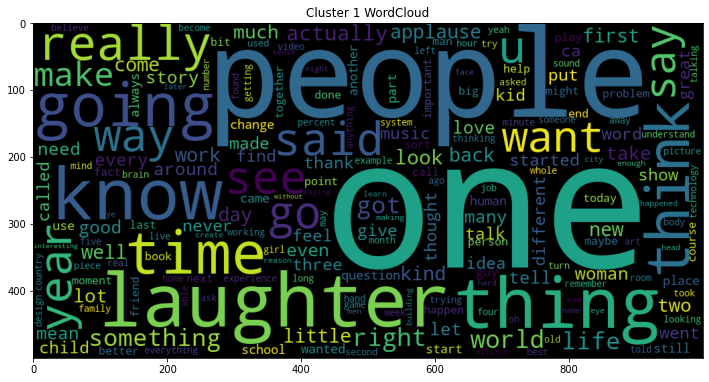

In [29]:
plt.figure(figsize=(12,10))
plt.imshow(cluster1_wordcloud)
plt.title("Cluster 1 WordCloud")

Text(0.5, 1.0, 'Cluster 2 WordCloud')

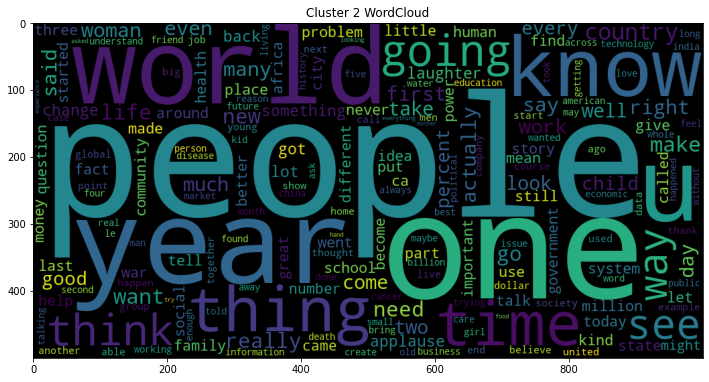

In [30]:
plt.figure(figsize=(12,10))
plt.imshow(cluster2_wordcloud)
plt.title("Cluster 2 WordCloud")

Text(0.5, 1.0, 'Cluster 3 WordCloud')

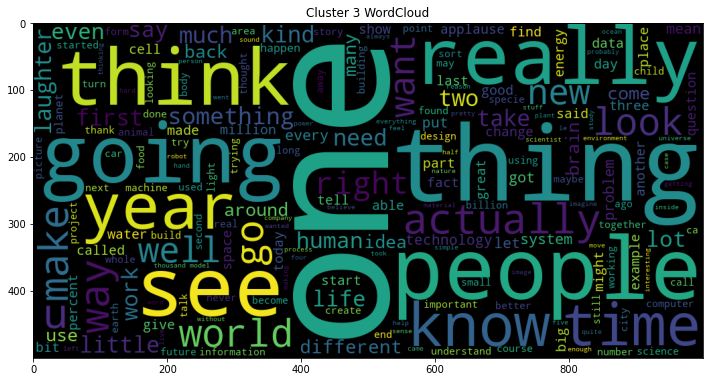

In [31]:
plt.figure(figsize=(12,10))
plt.imshow(cluster3_wordcloud)
plt.title("Cluster 3 WordCloud")

In [32]:
clustered_sentences = [[] for i in range(n_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(df['transcript'][sentence_id])
clustered_sentences

[['good morning laughter great blown away whole thing fact leaving laughter three theme running conference relevant want talk one extraordinary evidence human creativity presentation people variety range second put u place idea going happen term future idea may play interest education actually find everybody interest education find interesting dinner party say work education actually often dinner party frankly laughter work education asked laughter never asked back curiously strange say somebody know say say work education see blood run face like oh god know laughter one night week laughter ask education pin wall one thing go deep people right like religion money thing big interest education think huge vested interest partly education meant take u future ca grasp think child starting school year retiring nobody clue despite expertise parade past four day world look like five year time yet meant educating unpredictability think third part agreed nonetheless really extraordinary capacity

# **Topic Modelling**
* Topic modelling by using class based TF-IDF
* Similar to the traditional TF-IDF , here we perform calculations on cluster level instead of document level in case of traditional TF-IDF







In [33]:
df['Doc_id'] = range(len(df))
docs_per_cluster = df.groupby(['cluster'],as_index=False).agg({'transcript':' '.join})
docs_per_cluster

,cluster,transcript
0,0,good morning laughter great blown away whole t...
1,1,year ago took task teach global development sw...
2,2,today happy heard sustainable development save...


In [34]:

count = CountVectorizer(stop_words='english').fit(docs_per_cluster.transcript.values)

#frequency of each word
t = count.transform(docs_per_cluster.transcript.values).toarray()
#Total No of Words
w=t.sum(axis=1) 
#Term-Frequency t/w
tf = np.divide(t.T, w)

#Total Number of documents in the data before aggregating into clusters
no_of_documents = len(df)
#total frequency of word t across all classes n
sum_t = t.sum(axis=0)
#inverse document frequency
idf = np.log(np.divide(no_of_documents, sum_t)).reshape(-1, 1)


tf_idf = np.multiply(tf, idf)

In [35]:
words = count.get_feature_names()
labels = list(docs_per_cluster.cluster)
tf_idf_transposed = tf_idf.T
indices = tf_idf_transposed.argsort()[:,-20:]

In [36]:
top_n_words = {label: [(words[j], tf_idf_transposed[i][j]) for j in indices[i]][::-1] for i, label in enumerate(labels)}

In [37]:
print("Topics from Cluster1")
top_n_words[0]

Topics from Cluster1


[('yeah', 0.0008263361316533161),
 ('song', 0.0008009551329768543),
 ('oh', 0.0007856592873221636),
 ('audience', 0.000769936153142287),
 ('artist', 0.0007681349425427284),
 ('felt', 0.0007667797076887875),
 ('ted', 0.0007651773540993557),
 ('dad', 0.0007469895444086366),
 ('boy', 0.0007389040538982782),
 ('art', 0.0007339626802626471),
 ('feeling', 0.0007306531485102047),
 ('voice', 0.0007253728463292145),
 ('playing', 0.0007236434771133431),
 ('dance', 0.0007223298362922575),
 ('painting', 0.0007209133795639091),
 ('film', 0.0007208185424725375),
 ('conversation', 0.0007206188383133221),
 ('mom', 0.0007177696572599348),
 ('writing', 0.0007132851898344997),
 ('loved', 0.0006945140687692726)]

In [38]:
print("Topics from Cluster2")
top_n_words[1]

Topics from Cluster2


[('democracy', 0.0012188859817378217),
 ('aid', 0.0011902090473529903),
 ('violence', 0.0011136495304711821),
 ('political', 0.001091894093689402),
 ('police', 0.0010729631562279515),
 ('conflict', 0.00105087322501281),
 ('poverty', 0.001042248974910856),
 ('refugee', 0.0010382091901779077),
 ('china', 0.001032589065463635),
 ('compassion', 0.001010127860148287),
 ('election', 0.0009988230840115963),
 ('citizen', 0.0009971305166198091),
 ('india', 0.0009888402601163657),
 ('leader', 0.0009842544854014425),
 ('economic', 0.0009626636425968708),
 ('african', 0.0009578639446252228),
 ('poor', 0.0009561056029545064),
 ('income', 0.0009553605237313708),
 ('economy', 0.0009505441811859021),
 ('africa', 0.0009502972125151025)]

In [39]:
print("Topics from Cluster3")
top_n_words[2]

Topics from Cluster3


[('dna', 0.0009719516750868004),
 ('gene', 0.0009477730433519363),
 ('specie', 0.0009401615402878691),
 ('molecule', 0.0009226604800967019),
 ('ocean', 0.000916499058653543),
 ('neuron', 0.0009163502168953048),
 ('plant', 0.0009112973795432554),
 ('universe', 0.0009055678165738476),
 ('surface', 0.0008988984765918182),
 ('organism', 0.0008797844277079637),
 ('galaxy', 0.0008760894185940751),
 ('solar', 0.0008481778180172301),
 ('structure', 0.0008394982786733541),
 ('particle', 0.0008371822552773881),
 ('fish', 0.00083316259585288),
 ('theory', 0.000813283478884313),
 ('star', 0.0008119669373846602),
 ('coral', 0.0008108695445628574),
 ('pattern', 0.0007991202566645574),
 ('lab', 0.0007970948907518977)]

**summary**
* Cluster 1 topics have words like DNA,GENE,MOLECULE,ORGANISM,GENOME which are highly related to science(BIOLOGY) and species.
* Cluster 2 topics have words like AUDIENCE,FEELING,EMOTION,MUSIC,MOVIE,FILM which are related to Entertainment.
*  Cluster 2 topics have words like ELECTION,LEADER,ECONOMY,CONFLICT ETC which are related to politics and geography

**ADVANCED TOPIC MODELLING USING BERTopic**

In [40]:
!pip install bertopic

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [41]:
from bertopic import BERTopic

In [42]:
topic_model = BERTopic(embedding_model="all-MiniLM-L6-v2",calculate_probabilities=True,nr_topics="auto")
topics, probs = topic_model.fit_transform(df['transcript'])

In [43]:
 topic_model.get_topic_info()

,Topic,Count,Name
0,-1,1114,-1_people_one_like_thing
1,0,915,0_people_like_one_thing
2,1,90,1_universe_planet_see_galaxy
3,2,82,2_ocean_fish_sea_shark
4,3,68,3_cancer_patient_cell_drug
5,4,44,4_energy_nuclear_year_get
6,5,31,5_dna_gene_genome_cell
7,6,25,6_forest_tree_plastic_plant
8,7,19,7_bee_ant_insect_colony
9,8,18,8_vaccine_virus_disease_people


In [44]:
topic_model.get_topic(1)

[('universe', 0.029444160417946286),
 ('planet', 0.02513744922726955),
 ('see', 0.022976576468746276),
 ('galaxy', 0.02224311399151951),
 ('earth', 0.021732286074390577),
 ('star', 0.021684093474858303),
 ('one', 0.021238786484741375),
 ('like', 0.019467434257214058),
 ('mar', 0.018878413029388193),
 ('space', 0.018718389488995613)]

In [45]:
topic_model.get_topic(15)

False

In [46]:
topic_model.visualize_topics()

In [47]:
topic_model.visualize_hierarchy()

In [48]:
topic_model.visualize_barchart()